# MOwNiT
# Lab4

In [1]:
using Plots
using Polynomials
using DataFrames
using Statistics
using Interpolations
using CSV
using TaylorSeries

In [2]:
function naive_multiplication(A,B)
    C = zeros(Float64, size(A,1), size(B,2))
    for i=1:size(A,1)
        for j=1:size(B,2)
            for k=1:size(A,2)
                C[i,j] = C[i,j] + A[i,k]*B[k,j]
            end
        end
    end
    C
end

naive_multiplication (generic function with 1 method)

In [3]:
function better_multiplication(A, B)
    C = zeros(Float64, size(A,1), size(B,2))
    for j=1:size(B,2)
        for k=1:size(A,2)
            for i=1:size(A,1)
                C[i,j] = C[i,j] + A[i,k]*B[k,j]
            end
        end
    end
    C
end

better_multiplication (generic function with 1 method)

In [4]:
A = rand(1000,1000)
B = rand(1000,1000)
println(@elapsed naive_multiplication(A,B))
println(@elapsed better_multiplication(A,B))
println(@elapsed A*B)

3.5293105
2.194416001
1.102893999


# Zad1

In [5]:
naive_times = []
better_times = []
blas_times = []

k = 1
for i=100:50:1000
    push!(naive_times, [])
    push!(better_times, [])
    push!(blas_times, [])
    A = rand(i,i)
    B = rand(i,i)
    for j=1:10
        append!(naive_times[k], @elapsed naive_multiplication(A,B))
        append!(better_times[k], @elapsed better_multiplication(A,B))
        append!(blas_times[k], @elapsed A*B)
    end
    k += 1
end

# Julia times

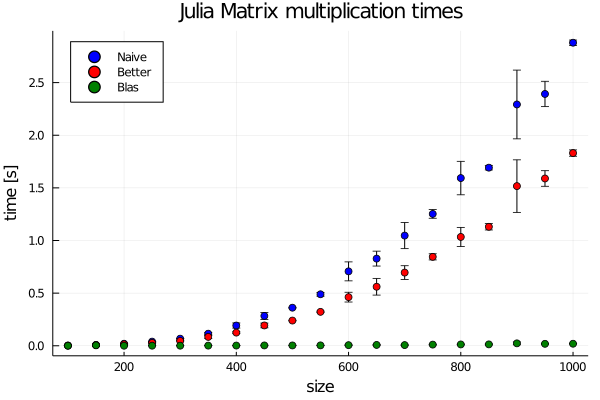

In [90]:
times = [naive_times ; better_times ; blas_times]
df = DataFrame()
types = ["Naive" "Better" "Blas"]
df[:, :Type] = [types[i] for i=1:3 for j=1:190]
df[:, :Size] = [i for j=1:3 for i=100:50:1000 for k=1:10]
df[:, :Time] = [times[j][i] for j=1:57 for i=1:10]

df_grouped = groupby(df, [:Type, :Size])
df_stats = combine(df_grouped, "Time" => mean, "Time" => std)

df_naive = df_stats[1:19, :]
df_better = df_stats[20:38, :]
df_blas = df_stats[39:57, :]
p1 = plot(df_naive.Size, df_naive.Time_mean, colour = :blue,label="Naive",
    yerr=df_naive.Time_std, seriestype=:scatter)

plot!(p1, df_better.Size, df_better.Time_mean, colour = :red,label="Better",
    yerr=df_better.Time_std,seriestype=:scatter)

plot!(p1, df_blas.Size, df_blas.Time_mean, colour = :green, title="Julia Matrix multiplication times",label="Blas",
    yerr=df_blas.Time_std,seriestype=:scatter,ylabel = "time [s]",xlabel = "size",legend=:topleft)

# C times

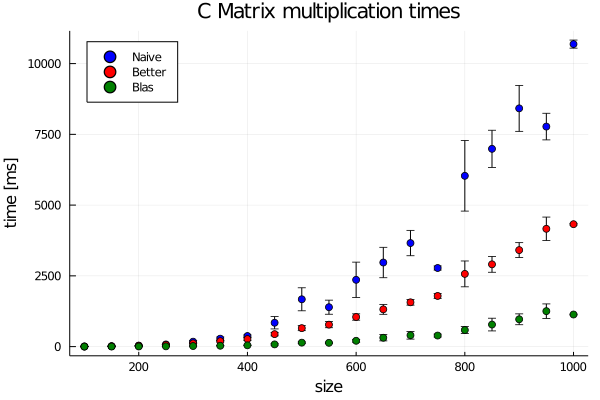

In [91]:
df_c = CSV.read("c_times.csv", delim=",", DataFrame)
df_c_grouped = groupby(df_c, :Size)
df_c_stats = combine(df_c_grouped, "Naive" => mean, "Naive" => std,"Better" => mean,
                                   "Better" => std,"Blas" => mean, "Blas" => std)

p2 = plot(df_c_stats.Size, df_c_stats.Naive_mean, colour = :blue,label="Naive",
    yerr=df_c_stats.Naive_std, seriestype=:scatter)

plot!(p2, df_c_stats.Size, df_c_stats.Better_mean, colour = :red,label="Better",
    yerr=df_c_stats.Better_std,seriestype=:scatter)

plot!(p2, df_c_stats.Size, df_c_stats.Blas_mean, colour = :green, title="C Matrix multiplication times",label="Blas",
    yerr=df_c_stats.Blas_std,seriestype=:scatter,ylabel = "time [ms]",xlabel = "size", legend=:topleft)

# C times optimized

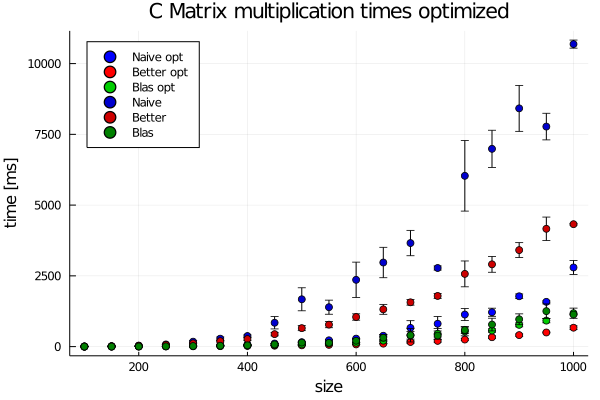

In [92]:
df_c_opt = CSV.read("c_times_optimizations.csv", delim=",", DataFrame)
df_c_opt_grouped = groupby(df_c_opt, :Size)
df_c_opt_stats = combine(df_c_opt_grouped, "Naive" => mean, "Naive" => std,"Better" => mean,
                                   "Better" => std,"Blas" => mean, "Blas" => std)

p3 = plot(df_c_opt_stats.Size, df_c_opt_stats.Naive_mean, colour = :blue, label="Naive opt",
    yerr=df_c_opt_stats.Naive_std, seriestype=:scatter)

plot!(p3, df_c_opt_stats.Size, df_c_opt_stats.Better_mean, colour = :red, label="Better opt",
    yerr=df_c_opt_stats.Better_std,seriestype=:scatter)

plot!(p3, df_c_opt_stats.Size, df_c_opt_stats.Blas_mean, colour = :green3, label="Blas opt",
    yerr=df_c_opt_stats.Blas_std,seriestype=:scatter)

plot!(p3, df_c_stats.Size, df_c_stats.Naive_mean, colour = :blue3,label="Naive",
    yerr=df_c_stats.Naive_std, seriestype=:scatter)

plot!(p3, df_c_stats.Size, df_c_stats.Better_mean, colour = :red3,label="Better",
    yerr=df_c_stats.Better_std,seriestype=:scatter)

plot!(p3, df_c_stats.Size, df_c_stats.Blas_mean, colour = :green, title="C Matrix multiplication times optimized",label="Blas",
    yerr=df_c_stats.Blas_std,seriestype=:scatter,ylabel = "time [ms]",xlabel = "size", legend=:topleft)

# Fitting polynomials

In [14]:
function fit_poly(X, Y)
    n = size(X)[1]
    itp = fit(X, Y, 3)
    x_interpolation = [i for i=X[1]:0.01:X[n]]
    y_interpolation = []
    for x in x_interpolation
        append!(y_interpolation, itp(x))
    end
    return x_interpolation, y_interpolation
end

fit_poly (generic function with 1 method)

## Julia times

In [94]:
X_naive = df_naive.Size
Y_naive = df_naive.Time_mean
X_better = df_better.Size
Y_better = df_better.Time_mean
X_blas = df_blas.Size
Y_blas = df_blas.Time_mean

xs = 100:0.01:1000
plot!(p1,fit_poly(X_naive,Y_naive), color = :blue, label = "Naive")
plot!(p1,fit_poly(X_better,Y_better), color = :red, label = "Better")
plot!(p1,fit_poly(X_blas,Y_blas), color = :green, label = "Blas", ylabel = "time [s]",
    xlabel = "size",title = "Julia times fitted polynomials", legend=:topleft)

# C times

```c
#include <stdio.h>
#include <stdlib.h>
#include <time.h>
#include <sys/times.h>
#include <gsl/gsl_blas.h>
#include <gsl/gsl_matrix.h>

double** create_arr(int N, int M){
    double** arr = malloc(N * sizeof(double*));
    for (int i = 0 ; i < N ; i++){
        arr[i] = malloc(M * sizeof(double));
    }
    for (int i = 0 ; i < N ; i++){
        for (int j = 0 ; j < M ; j++){
            arr[i][j] = rand();
        }
    }
    return arr;
}

void remove_arr(int N, double** arr){
    for (int i = 0 ; i < N ; i++){
        free(arr[i]);
    }
    free(arr);
}


gsl_matrix* create_gsl_matrix(int N, int M){
    gsl_matrix* arr = gsl_matrix_alloc(N,M);
    for (size_t i = 0 ; i < N ; i ++){
        for (size_t j = 0 ; j < M ; j++){
            gsl_matrix_set(arr, i, j, rand());
        }
    }
    return arr;
}



void print_arr(int N, int M, double **arr){
    for (int i = 0 ; i < N ; i++){
        for (int j = 0 ; j < M ; j++){
            printf("%f ", arr[i][j]);
        }
        printf("\n");
    }
}


double** naive_multiplication(int N1, int N2, int M1, int M2, double** A, double** B){
    if (N2 != M1){
        printf("%s\n", "Invalid size of arrays");
        exit(1);
    }

    double** C = malloc(N1 * sizeof(double*));
    for (int i = 0 ; i < N1 ; i++){
        C[i] = malloc(M2 * sizeof(double));
    }

    for (int i = 0 ; i < N1 ; i++){
        for (int j = 0 ; j < M2 ; j++){
            for (int k = 0 ; k < N2 ; k++){
                C[i][j] = C[i][j] + A[i][k] * B[k][j];
            }
        }
    }

    return C;
}


double** better_multiplication(int N1, int N2, int M1, int M2, double** A, double** B){
    if (N2 != M1){
        printf("%s\n", "Invalid size of arrays");
        exit(1);
    }

    double** C = malloc(N1 * sizeof(double*));
    for (int i = 0 ; i < N1 ; i++){
        C[i] = malloc(M2 * sizeof(double));
    }

    for (int i = 0 ; i < N1 ; i++){
        for (int k = 0 ; k < N2 ; k++){
            for (int j = 0 ; j < M2 ; j++){
                C[i][j] = C[i][j] + A[i][k] * B[k][j];
            }
        }
    }

    return C;
}



int main()
{
    srand ( time ( NULL));
    clock_t start, end;
    double real_time = 0;
    double* naive_times = malloc(190 * sizeof(double));
    double* better_times = malloc(190 * sizeof(double));
    double* blas_times = malloc(190 * sizeof(double));

    int k = 0;
    for (int size = 100 ; size <= 1000 ; size = size + 50){
        double** A = create_arr(size,size);
        double** B = create_arr(size,size);
        gsl_matrix* A2 = create_gsl_matrix(size,size);
        gsl_matrix* B2 = create_gsl_matrix(size,size);
        printf("size %d\n", size);
        for (int i = 0 ; i < 10 ; i++){
            start = clock();
            double** C1 = naive_multiplication(size,size,size,size,A,B);
            end = clock();
            real_time = (double)(end - start) *1000.0 / CLOCKS_PER_SEC;
            naive_times[(k*10)+i] = real_time;
            remove_arr(size, C1);

            start = clock();
            double** C2 = better_multiplication(size,size,size,size,A,B);
            end = clock();
            real_time = (double)(end - start) *1000.0 / CLOCKS_PER_SEC;
            better_times[(k*10)+i] = real_time;
            remove_arr(size, C2);

            gsl_matrix* C3 = create_gsl_matrix(size,size);
            start = clock();
            gsl_blas_dgemm(CblasNoTrans, CblasNoTrans, 1.0, A2, B2, 0.0, C3); 
            end = clock();
            real_time = (double)(end - start) *1000.0 / CLOCKS_PER_SEC;
            blas_times[(k*10)+i] = real_time;
            gsl_matrix_free(C3);

        }
        remove_arr(size,A);
        remove_arr(size,B);
        gsl_matrix_free(A2);
        gsl_matrix_free(B2);
        k++;
    }
    
    FILE *f;
    f = fopen("c_times.csv", "w+");
    fprintf(f,"Size, Naive, Better, Blas\n");
    
    k = 0;
    for (int i = 100 ; i <= 1000 ; i = i + 50){
    	for (int j = 0 ; j < 10 ; j++){
            fprintf(f,"%d, %f, %f, %f\n", i, naive_times[k], better_times[k], blas_times[k]);
            k++;
    	}
    }
    
    fclose(f);
    free(naive_times);
    free(better_times);
    free(blas_times);

    return 0;
}


```

In [95]:
X_c_naive = df_c_stats.Size
Y_c_naive = df_c_stats.Naive_mean
X_c_better = df_c_stats.Size
Y_c_better = df_c_stats.Better_mean
X_c_blas = df_c_stats.Size
Y_c_blas = df_c_stats.Blas_mean

xs = 100:0.01:1000
plot!(p2, fit_poly(X_c_naive,Y_c_naive), color = :blue, label = "Naive")
plot!(p2, fit_poly(X_c_better,Y_c_better), color = :red, label = "Better")
plot!(p2, fit_poly(X_c_blas,Y_c_blas), color = :green, label = "Blas", ylabel = "time [ms]",
    xlabel = "size",title = "C times fitted polynomials", legend=:topleft)

# C times optimized

In [96]:
X_c_opt_naive = df_c_opt_stats.Size
Y_c_opt_naive = df_c_opt_stats.Naive_mean
X_c_opt_better = df_c_opt_stats.Size
Y_c_opt_better = df_c_opt_stats.Better_mean
X_c_opt_blas = df_c_opt_stats.Size
Y_c_opt_blas = df_c_opt_stats.Blas_mean

xs = 100:0.01:1000
plot!(p3, fit_poly(X_c_naive,Y_c_naive), color = :blue3, label = "Naive")
plot!(p3, fit_poly(X_c_better,Y_c_better), color = :red3, label = "Better")
plot!(p3, fit_poly(X_c_blas,Y_c_blas), color = :green, label = "Blas")
plot!(p3, fit_poly(X_c_opt_naive,Y_c_opt_naive), color = :blue, label = "Naive opt")
plot!(p3, fit_poly(X_c_opt_better,Y_c_opt_better), color = :red, label = "Better opt")
plot!(p3, fit_poly(X_c_opt_blas,Y_c_opt_blas), color = :green3, label = "Blas opt", ylabel = "time [ms]",
    xlabel = "size",title = "C optimized times fitted polynomials", legend=:topleft)

# Zad2

In [4]:
function PolynomialInterpolation(X, Y)
    n = size(X)[1]
    itp = fit(X, Y)
    x_interpolation = [i for i=X[1]:0.01:X[n]]
    y_interpolation = []
    for x in x_interpolation
        append!(y_interpolation, itp(x))
    end
    return x_interpolation, y_interpolation
end

PolynomialInterpolation (generic function with 1 method)

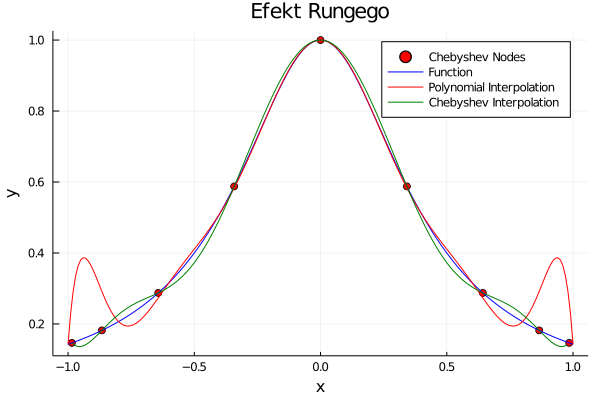

In [23]:
f(x) = 1 / (1 + 6x^2)
X = -1:0.2:1
Y = [f(x) for x in X]
X_f = -1:0.01:1
Y_f = [f(x) for x in X_f]
chebyshev_polynomial = ChebyshevT([0, 0, 0, 0, 0, 0, 0, 0, 0, 1])
roots = sort(Polynomials.roots(chebyshev_polynomial))
Y_roots = [f(x) for x in roots]
plot(roots,Y_roots, color = :red, seriestype = :scatter, label = "Chebyshev Nodes", xaxis = "x", yaxis = "y")
plot!(X_f, Y_f, color= :blue, label="Function")
plot!(PolynomialInterpolation(X,Y), color = :red, label = "Polynomial Interpolation")
plot!(PolynomialInterpolation(roots,Y_roots), color = :green, label = "Chebyshev Interpolation", title="Efekt Rungego")

# Zad 3

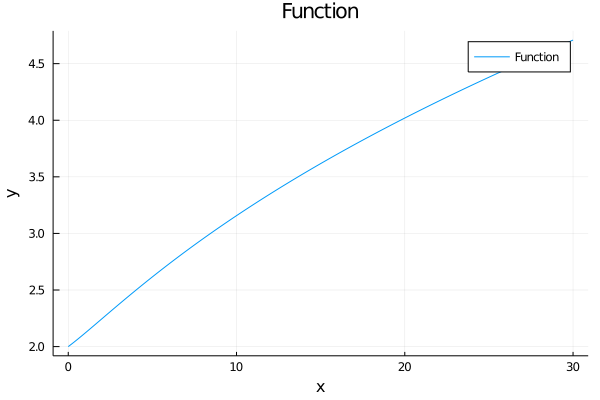

In [44]:
func(x) = (7 + (1 + x)^(4/3))^(1/3)
X = 0:0.01:30
Y = [func(x) for x in X]
plot(X,Y, label = "Function", xaxis="x", yaxis="y", title="Function")

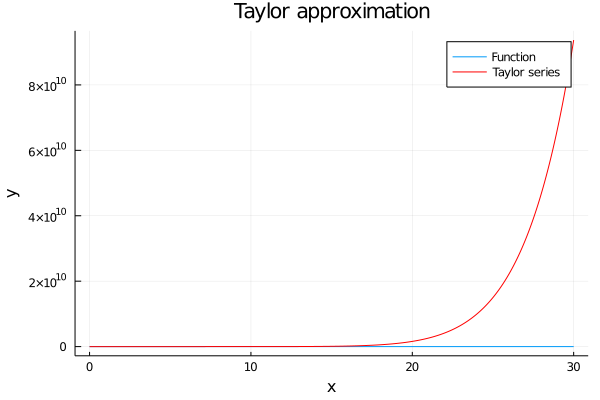

In [47]:
func_t = func(Taylor1(Float64, 10))
func_t_poly = Polynomial(func_t.coeffs)
Y_t = [func_t_poly(x) for x in X]
plot(X,Y, label = "Function", xaxis="x", yaxis="y")
plot!(X,Y_t, color = :red,label = "Taylor series", title="Taylor approximation")

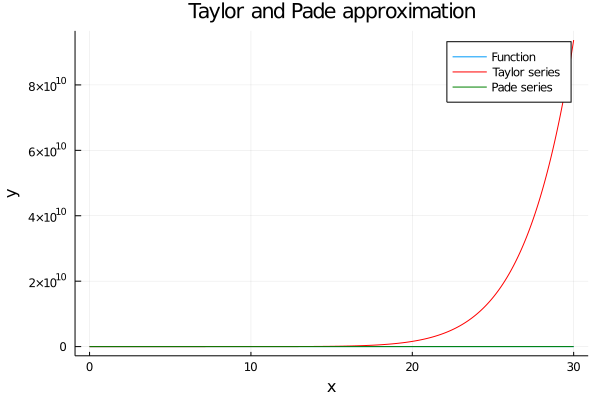

In [48]:
func_pade = Polynomials.PolyCompat.PadeApproximation.Pade(func_t_poly, 2, 2)
Y_pade = [func_pade(x) for x in X]
plot(X,Y, label = "Function", xaxis="x", yaxis="y")
plot!(X,Y_t, color = :red,label = "Taylor series")
plot!(X,Y_pade, color = :green, label = "Pade series", title="Taylor and Pade approximation")